In [1]:
import pandas as pd 
import numpy as np
import os 
import seaborn as sns
import pylab as pl
import folium
from folium import plugins

In [2]:
cities_df= pd.read_csv("../data/cities.csv")

In [3]:
lines_df=pd.read_csv("../data/lines.csv")

In [4]:
station_lines_df=pd.read_csv("../data/station_lines.csv")

In [5]:
stations_df=pd.read_csv("../data/stations.csv")

In [6]:
systems_df=pd.read_csv("../data/systems.csv")


In [7]:
track_lines_df=pd.read_csv("../data/track_lines.csv")

In [8]:
tracks_df=pd.read_csv("../data/tracks.csv")

In [9]:
tracks_df

,id,geometry,buildstart,opening,closure,length,city_id
0,1911,"LINESTRING(19.0817752 47.5005079,19.0817355 47...",0.0,0.0,999999.0,6719,29
1,2563,"LINESTRING(16.4151057 48.1907238,16.4156455 48...",0.0,0.0,999999.0,199,118
2,2557,"LINESTRING(16.4164437 48.1839655,16.4161534 48...",0.0,0.0,999999.0,925,118
3,2558,"LINESTRING(16.4164901 48.1839473,16.416198 48....",0.0,0.0,999999.0,881,118
4,2564,"LINESTRING(16.415259 48.1908074,16.4153634 48....",0.0,0.0,999999.0,213,118
...,...,...,...,...,...,...,...
9266,9732,"LINESTRING(-3.838067 56.0044551,-3.8385588 56....",0.0,0.0,999999.0,383,48
9267,9734,"LINESTRING(-3.8549229 55.9960854,-3.8544735 55...",0.0,0.0,999999.0,28,48
9268,9735,"LINESTRING(-3.8597111 55.9955538,-3.8572319 55...",0.0,0.0,999999.0,305,48
9269,9736,"LINESTRING(-3.8544735 55.9961285,-3.8529015 55...",0.0,0.0,999999.0,828,48


In [10]:
tracks_df.sample(10)



,id,geometry,buildstart,opening,closure,length,city_id
1528,3039,"LINESTRING(-1.5296037 47.2530638,-1.529738 47....",2011.0,2012.0,999999.0,61,265
4021,3982,"LINESTRING(139.729154315333 35.6859853021242,1...",1903.0,1903.0,1970.0,2106,114
5057,7625,"LINESTRING(18.0424824 59.3811825,18.0426674 59...",0.0,0.0,999999.0,109,110
4303,4036,"LINESTRING(2.4558816 48.7865648,2.4560418 48.7...",NaN,1974.0,999999.0,549,95
457,2744,LINESTRING(-46.8158349892393 -23.5238875512368...,2012.0,NaN,999999.0,2169,106
8410,8608,LINESTRING(-70.7056326948135 -33.4566809083853...,2014.0,2014.0,999999.0,876,4
4542,7573,"LINESTRING(6.0379137 47.2484035,6.0389237 47.2...",2011.0,2014.0,999999.0,331,283
5346,4871,"LINESTRING(-79.2534892890833 43.7193183552459,...",1967.0,1967.0,999999.0,19633,247
9105,9388,"LINESTRING(-58.42639 -34.57839,-58.42735 -34.5...",1886.0,1888.0,999999.0,388,1
1232,3005,"LINESTRING(-0.5547021 44.7976952,-0.5541543 44...",NaN,2015.0,999999.0,44,23


In [11]:
cities_df.sample(10)

,id,name,coords,start_year,url_name,country,country_state
315,126,Guadalajara,POINT(-103.351944 20.666111),1987.0,guadalajara,México,NaN
10,17,Belfast,POINT(-5.933333333 54.61666667),2017.0,belfast,Northern Ireland,NaN
200,134,Baltimore,POINT(-76.63333333 39.3),2017.0,baltimore,United States,Md.
117,305,Dijon,POINT(5.030018268 47.33040428),2009.0,dijon,France,NaN
248,193,Miami,POINT(-80.2 25.76666667),2017.0,miami,United States,Fla.
92,70,Lyons,POINT(4.833333333 45.75),1862.0,lyons,France,NaN
168,335,La Plata,POINT(-57.953772 -34.919392),NaN,la-plata,Argentina,Buenos Aires
41,282,Arras,POINT(2.783333698 50.28332481),2018.0,arras,France,NaN
309,256,Valencia,POINT(-0.375 39.466667),1994.0,valencia,Spain,NaN
310,259,Rosario,POINT(-60.65 -32.95),2017.0,rosario,Argentina,NaN


In [12]:
station_lines_df.sample(10)

,id,station_id,line_id,city_id,created_at,updated_at
12371,15758,15450,219,110,2018-11-07 23:57:55.732403,2018-11-07 23:57:55.732403
14309,7168,5460,436,114,2017-11-21 00:00:00,2017-11-21 00:00:00
11012,12650,12658,1207,325,2018-08-01 13:59:23.94969,2018-08-01 13:59:23.94969
10895,15675,15368,1450,91,2018-11-04 17:21:08.476369,2018-11-04 17:21:08.476369
11937,13290,13173,1248,294,2018-09-23 21:39:21.830374,2018-09-23 21:39:21.830374
14120,6976,5408,479,114,2017-11-21 00:00:00,2017-11-21 00:00:00
3433,3542,662,85,14,2017-11-21 00:00:00,2017-11-21 00:00:00
14343,7202,3508,165,78,2017-11-21 00:00:00,2017-11-21 00:00:00
1706,1744,8101,644,1,2017-11-21 00:00:00,2017-11-21 00:00:00
8243,15975,15665,1344,91,2018-11-13 22:07:48.739393,2018-11-13 22:07:48.739393


In [13]:
stations_df.sample(10)

,id,name,geometry,buildstart,opening,closure,city_id
8526,4330,Blanche,POINT(2.33365451941856 48.883469025399),NaN,1902.0,999999.0,95
10827,9881,Chichibu,POINT(139.085907937482 35.9983897473929),1914.0,1914.0,999999.0,114
8695,8542,Grange Blanche,POINT(4.8795981 45.7424648),0.0,0.0,999999.0,70
7605,5754,Rue de Rosny,POINT(2.45775149094334 48.8669897921106),2015.0,2019.0,999999.0,95
11509,11461,Togane,POINT(140.363979900791 35.5600347493102),1926.0,1926.0,1961.0,114
10843,11530,Wadagahara,POINT(139.118298216466 35.3159149917482),1925.0,1925.0,999999.0,114
228,7761,Périer,POINT(5.3875983 43.2794419),NaN,1986.0,999999.0,74
12046,10153,Sandstraße,POINT(11.5581254 48.1505965),0.0,0.0,999999.0,82
10229,10958,Antero de Quental,POINT(-43.2235693 -22.9844923),0.0,2016.0,999999.0,102
1324,6871,Mutters Kreith,POINT(11.3807371 47.2026946),0.0,0.0,999999.0,267


In [14]:
cities_df.sample(10)

,id,name,coords,start_year,url_name,country,country_state
316,66,Lima,POINT(-77.018611 -12.035),1984.0,lima,Peru,NaN
297,244,Syracuse,POINT(-76.13333333 43.03333333),2017.0,syracuse,United States,N.Y.
195,129,Amarillo,POINT(-101.8333333 35.18333333),2017.0,amarillo,United States,Tex.
29,25,Brisbane,POINT(153.1333333 -27.48333333),2017.0,brisbane,Australia,NaN
123,331,Le Havre,POINT(0.104970051 49.50497438),1890.0,le-havre,France,NaN
248,193,Miami,POINT(-80.2 25.76666667),2017.0,miami,United States,Fla.
331,266,Rennes,POINT(-1.680833 48.114167),1897.0,rennes,France,NaN
127,84,Nagoya,POINT(136.9333333 35.11666667),2017.0,nagoya,Japan,NaN
0,5,Aberdeen,POINT(-2.15 57.15),2017.0,aberdeen,Scotland,NaN
206,150,Columbia,POINT(-81.03333333 34),2017.0,columbia,United States,S.C.


In [15]:
cities_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 334 entries, 0 to 333
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             334 non-null    int64  
 1   name           334 non-null    object 
 2   coords         334 non-null    object 
 3   start_year     331 non-null    float64
 4   url_name       334 non-null    object 
 5   country        334 non-null    object 
 6   country_state  134 non-null    object 
dtypes: float64(1), int64(1), object(5)
memory usage: 18.4+ KB


In [16]:
# Drop not needed columns
cities_df=cities_df.drop('country_state', axis=1)

In [17]:
# add lat/long data 
cities_df['Long']=cities_df['coords'].apply(lambda x: x.split('POINT(')[1].split(' ')[0])
cities_df['Lat']=cities_df['coords'].apply(lambda x: x.split('POINT(')[1].split(' ')[1].split(')')[0])
cities_df=cities_df.drop('coords', axis=1)

In [18]:
cities_df.head()

,id,name,start_year,url_name,country,Long,Lat
0,5,Aberdeen,2017.0,aberdeen,Scotland,-2.15,57.15
1,6,Adelaide,2017.0,adelaide,Australia,138.6,-34.91666667
2,7,Algiers,2017.0,algiers,Algeria,3,36.83333333
3,9,Ankara,2017.0,ankara,Turkey,32.91666667,39.91666667
4,16,Belém,2017.0,belem,Brazil,-48.48333333,-1.466666667


In [19]:
# For cities- linegraph with time and location

In [20]:
lines_df.head(10)

,id,city_id,name,url_name,color,system_id,transport_mode_id
0,43,4,Línea 2,43-linea-2,#ffbe2e,267,4.0
1,75,34,Línea 3 Metro de Caracas,75-linea-3-metro-de-caracas,#000,119,NaN
2,107,126,Línea 1,107-linea-1,#434343,249,NaN
3,604,74,La navette,604-la-navette,#009ab9,346,NaN
4,61,66,Línea 1 (Tramo 1A),61-linea-1,#49aa43,250,NaN
5,1471,91,Tokaido Shinkansen,1471-tokaido-shinkansen,#0000ff,551,1.0
6,5,1,A,a,#00b3da,254,4.0
7,168,261,Línea 1,168-linea-1,#f58223,256,NaN
8,219,110,14,219-red-line,#d0021b,257,4.0
9,45,4,Línea 4,45-linea-4,#292d91,267,4.0


In [21]:
lines_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1343 entries, 0 to 1342
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 1343 non-null   int64  
 1   city_id            1343 non-null   int64  
 2   name               1343 non-null   object 
 3   url_name           1343 non-null   object 
 4   color              1343 non-null   object 
 5   system_id          1343 non-null   int64  
 6   transport_mode_id  926 non-null    float64
dtypes: float64(1), int64(3), object(3)
memory usage: 73.6+ KB


In [22]:
cities_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 334 entries, 0 to 333
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          334 non-null    int64  
 1   name        334 non-null    object 
 2   start_year  331 non-null    float64
 3   url_name    334 non-null    object 
 4   country     334 non-null    object 
 5   Long        334 non-null    object 
 6   Lat         334 non-null    object 
dtypes: float64(1), int64(1), object(5)
memory usage: 18.4+ KB


In [23]:
cities_df.rename(columns={"id": "city_id"}, inplace=True)

In [24]:
cities_df

,city_id,name,start_year,url_name,country,Long,Lat
0,5,Aberdeen,2017.0,aberdeen,Scotland,-2.15,57.15
1,6,Adelaide,2017.0,adelaide,Australia,138.6,-34.91666667
2,7,Algiers,2017.0,algiers,Algeria,3,36.83333333
3,9,Ankara,2017.0,ankara,Turkey,32.91666667,39.91666667
4,16,Belém,2017.0,belem,Brazil,-48.48333333,-1.466666667
...,...,...,...,...,...,...,...
329,265,Nantes,1877.0,nantes,France,-1.553889,47.217222
330,110,Stockholm,1919.0,stockholm,Sweden,18.05,59.28333333
331,266,Rennes,1897.0,rennes,France,-1.680833,48.114167
332,15,Beijing,1965.0,beijing,China,116.4166667,39.91666667


In [25]:
lines_df.head() #London city id 69

,id,city_id,name,url_name,color,system_id,transport_mode_id
0,43,4,Línea 2,43-linea-2,#ffbe2e,267,4.0
1,75,34,Línea 3 Metro de Caracas,75-linea-3-metro-de-caracas,#000,119,NaN
2,107,126,Línea 1,107-linea-1,#434343,249,NaN
3,604,74,La navette,604-la-navette,#009ab9,346,NaN
4,61,66,Línea 1 (Tramo 1A),61-linea-1,#49aa43,250,NaN


In [26]:
lines_df["transport_mode_id"].info

<bound method Series.info of 0       4.0
1       NaN
2       NaN
3       NaN
4       NaN
       ... 
1338    7.0
1339    7.0
1340    7.0
1341    7.0
1342    7.0
Name: transport_mode_id, Length: 1343, dtype: float64>

In [27]:
London_Transportation_Modes=lines_df[lines_df['city_id'] == 69]

In [28]:
London_Transportation_Modes

,id,city_id,name,url_name,color,system_id,transport_mode_id
124,118,69,Waterloo & City Line,118-waterloo-&-city-line,#50e3c2,259,4.0
125,115,69,Northern Line,115-norther-line,#000,259,4.0
126,117,69,"Circle Line - Circle via Euston, Victoria, Tow...",117-circle-line,#fdfa07,259,3.0
147,116,69,Central Line - Epping to West Ruislip & Ealing...,116-central-line,#fb0303,259,4.0
245,143,69,Victoria Line,143-victoria,#02dafb,259,4.0
249,162,69,Piccadilly Line,162-piccadilly-line,#000bbc,259,4.0
258,203,69,Tramlink,203-tramlink,#50e71b,263,9.0
259,167,69,Emirates Airline,167-emirates-airline,#c00000,263,7.0
260,209,69,Elizabeth Line,209-elizabeth-line,#6518a1,263,3.0
282,160,69,DLR,160-dlr,#86e9c8,263,5.0


In [29]:
track_lines_df

,id,section_id,line_id,created_at,updated_at,city_id
0,2494,1278,343,2017-11-21 00:00:00,2017-11-21 00:00:00,252
1,4124,4477,779,2017-11-21 00:09:55.135507,2017-11-21 00:09:55.135507,63
2,2495,21,9,2017-11-21 00:00:00,2017-11-21 00:00:00,1
3,2496,940,228,2017-11-21 00:00:00,2017-11-21 00:00:00,79
4,4129,4478,793,2017-11-21 17:44:39.765832,2017-11-21 17:44:39.765832,48
...,...,...,...,...,...,...
9752,10699,10530,1611,2019-03-06 22:23:46.008756,2019-03-06 22:23:46.008756,91
9753,10700,10531,1611,2019-03-06 22:27:46.532431,2019-03-06 22:27:46.532431,91
9754,10701,10532,1611,2019-03-06 22:30:58.779519,2019-03-06 22:30:58.779519,91
9755,10702,10533,1610,2019-03-08 21:57:21.68915,2019-03-08 21:57:21.68915,91


In [30]:
London_track_lines=track_lines_df[track_lines_df['city_id'] == 69]

In [31]:
London_track_lines

,id,section_id,line_id,created_at,updated_at,city_id
2536,2499,917,224,2017-11-21 00:00:00,2017-11-21 00:00:00,69
2537,2500,921,172,2017-11-21 00:00:00,2017-11-21 00:00:00,69
2538,2501,918,209,2017-11-21 00:00:00,2017-11-21 00:00:00,69
2539,2503,920,171,2017-11-21 00:00:00,2017-11-21 00:00:00,69
2540,2504,919,171,2017-11-21 00:00:00,2017-11-21 00:00:00,69
...,...,...,...,...,...,...
6470,2476,916,224,2017-11-21 00:00:00,2017-11-21 00:00:00,69
6471,2477,922,172,2017-11-21 00:00:00,2017-11-21 00:00:00,69
6472,2478,923,172,2017-11-21 00:00:00,2017-11-21 00:00:00,69
7117,3662,517,162,2017-11-21 00:00:00,2017-11-21 00:00:00,69


In [32]:
from IPython.display import display, HTML 

display(HTML('<div style="display: flex;"> \
                <div style="margin-right: 20px;">' + London_track_lines.to_html() + '</div> \
                <div>' + London_Transportation_Modes.to_html() + '</div> \
              </div>'))

,id,section_id,line_id,created_at,updated_at,city_id
2536,2499,917,224,2017-11-21 00:00:00,2017-11-21 00:00:00,69
2537,2500,921,172,2017-11-21 00:00:00,2017-11-21 00:00:00,69
2538,2501,918,209,2017-11-21 00:00:00,2017-11-21 00:00:00,69
2539,2503,920,171,2017-11-21 00:00:00,2017-11-21 00:00:00,69
2540,2504,919,171,2017-11-21 00:00:00,2017-11-21 00:00:00,69
3225,238,454,143,2017-11-21 00:00:00,2017-11-21 00:00:00,69
3226,239,529,163,2017-11-21 00:00:00,2017-11-21 00:00:00,69
3246,259,438,151,2017-11-21 00:00:00,2017-11-21 00:00:00,69
3281,297,788,115,2017-11-21 00:00:00,2017-11-21 00:00:00,69
3295,311,501,160,2017-11-21 00:00:00,2017-11-21 00:00:00,69


In [33]:
tracks_df

,id,geometry,buildstart,opening,closure,length,city_id
0,1911,"LINESTRING(19.0817752 47.5005079,19.0817355 47...",0.0,0.0,999999.0,6719,29
1,2563,"LINESTRING(16.4151057 48.1907238,16.4156455 48...",0.0,0.0,999999.0,199,118
2,2557,"LINESTRING(16.4164437 48.1839655,16.4161534 48...",0.0,0.0,999999.0,925,118
3,2558,"LINESTRING(16.4164901 48.1839473,16.416198 48....",0.0,0.0,999999.0,881,118
4,2564,"LINESTRING(16.415259 48.1908074,16.4153634 48....",0.0,0.0,999999.0,213,118
...,...,...,...,...,...,...,...
9266,9732,"LINESTRING(-3.838067 56.0044551,-3.8385588 56....",0.0,0.0,999999.0,383,48
9267,9734,"LINESTRING(-3.8549229 55.9960854,-3.8544735 55...",0.0,0.0,999999.0,28,48
9268,9735,"LINESTRING(-3.8597111 55.9955538,-3.8572319 55...",0.0,0.0,999999.0,305,48
9269,9736,"LINESTRING(-3.8544735 55.9961285,-3.8529015 55...",0.0,0.0,999999.0,828,48


In [34]:
tracks_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9271 entries, 0 to 9270
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          9271 non-null   int64  
 1   geometry    9271 non-null   object 
 2   buildstart  7663 non-null   float64
 3   opening     9250 non-null   float64
 4   closure     9240 non-null   float64
 5   length      9271 non-null   int64  
 6   city_id     9271 non-null   int64  
dtypes: float64(3), int64(3), object(1)
memory usage: 507.1+ KB


In [35]:
tracks_df["geometry"].describe(include="all")

count                                                  9271
unique                                                 9271
top       LINESTRING(-3.8599176 55.9955291,-3.8597111 55...
freq                                                      1
Name: geometry, dtype: object

In [36]:
tracks_df.info()
tracks_df.head(10)
tracks_df[tracks_df["city_id"] == 69]
tracks_df["geometry"][0]

#tracks_df["Long"] = tracks_df["coords"].apply(lambda x: x.split('Line(')[1].split(' ')[0])
#tracks_df["Lat"] = tracks_df["coords"].apply(lambda x: x.split('POINT(')[1].split(' ')[1].split(")")[0])

def get_lat_long(x):
    if x == "LINESTRING Z EMPTY":
        return []
    else:
        x = x[:-1]
        lat_long_string= x.split('LINESTRING(')[1]
        lat_long_list = lat_long_string.split(",")
        lst = []
        for item in lat_long_list:
            lst.append(item.split(" "))
        return lst
    


tracks_df["Lat Long List"] = tracks_df["geometry"].apply(get_lat_long)

tracks_df["Lat Long List"].head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9271 entries, 0 to 9270
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          9271 non-null   int64  
 1   geometry    9271 non-null   object 
 2   buildstart  7663 non-null   float64
 3   opening     9250 non-null   float64
 4   closure     9240 non-null   float64
 5   length      9271 non-null   int64  
 6   city_id     9271 non-null   int64  
dtypes: float64(3), int64(3), object(1)
memory usage: 507.1+ KB


0    [[19.0817752, 47.5005079], [19.0817355, 47.500...
1    [[16.4151057, 48.1907238], [16.4156455, 48.190...
2    [[16.4164437, 48.1839655], [16.4161534, 48.183...
3    [[16.4164901, 48.1839473], [16.416198, 48.1836...
4    [[16.415259, 48.1908074], [16.4153634, 48.1907...
5    [[16.4120893, 48.1927723], [16.4130719, 48.192...
6    [[16.412035, 48.1927423], [16.4129962, 48.1921...
7    [[16.3949694, 48.2005582], [16.3984035, 48.198...
8    [[139.387327940585, 35.3676500392482], [139.38...
9    [[139.407314018783, 35.3308431975794], [139.40...
Name: Lat Long List, dtype: object

In [37]:
tracks_df

,id,geometry,buildstart,opening,closure,length,city_id,Lat Long List
0,1911,"LINESTRING(19.0817752 47.5005079,19.0817355 47...",0.0,0.0,999999.0,6719,29,"[[19.0817752, 47.5005079], [19.0817355, 47.500..."
1,2563,"LINESTRING(16.4151057 48.1907238,16.4156455 48...",0.0,0.0,999999.0,199,118,"[[16.4151057, 48.1907238], [16.4156455, 48.190..."
2,2557,"LINESTRING(16.4164437 48.1839655,16.4161534 48...",0.0,0.0,999999.0,925,118,"[[16.4164437, 48.1839655], [16.4161534, 48.183..."
3,2558,"LINESTRING(16.4164901 48.1839473,16.416198 48....",0.0,0.0,999999.0,881,118,"[[16.4164901, 48.1839473], [16.416198, 48.1836..."
4,2564,"LINESTRING(16.415259 48.1908074,16.4153634 48....",0.0,0.0,999999.0,213,118,"[[16.415259, 48.1908074], [16.4153634, 48.1907..."
...,...,...,...,...,...,...,...,...
9266,9732,"LINESTRING(-3.838067 56.0044551,-3.8385588 56....",0.0,0.0,999999.0,383,48,"[[-3.838067, 56.0044551], [-3.8385588, 56.0040..."
9267,9734,"LINESTRING(-3.8549229 55.9960854,-3.8544735 55...",0.0,0.0,999999.0,28,48,"[[-3.8549229, 55.9960854], [-3.8544735, 55.996..."
9268,9735,"LINESTRING(-3.8597111 55.9955538,-3.8572319 55...",0.0,0.0,999999.0,305,48,"[[-3.8597111, 55.9955538], [-3.8572319, 55.995..."
9269,9736,"LINESTRING(-3.8544735 55.9961285,-3.8529015 55...",0.0,0.0,999999.0,828,48,"[[-3.8544735, 55.9961285], [-3.8529015, 55.996..."


In [38]:
import folium 

# Initialize a map centered around the average location
all_latitudes = [lat for line in tracks_df['Lat Long List'] for lat, lon in line]
all_longitudes = [lon for line in tracks_df['Lat Long List'] for lat, lon in line]
center_lat = sum(all_latitudes) / len(all_latitudes)
center_lon = sum(all_longitudes) / len(all_longitudes)

m = folium.Map(location=[center_lat, center_lon], zoom_start=6)

# Add each rail line as a PolyLine
for index, row in df.iterrows():
    line_coords = [(lat, lon) for lat, lon in row['Lat Long List']]
    folium.PolyLine(line_coords, color='blue', weight=2.5, opacity=0.8).add_to(m)

# Display the map
m.save('rail_lines_map.html')

TypeError: unsupported operand type(s) for +: 'int' and 'str'

In [ ]:
pip install folium



   -------------------- ------------------- 1/2 [folium]
   -------------------- ------------------- 1/2 [folium]
   ---------------------------------------- 2/2 [folium]



In [ ]:
import folium 
import pandas as pd 

def convert_to_float(coord):
    lat, lon = coord 
    return (float,(lat), float(lon))

# Convert list of lat lon coord to a float/ numeric value to proccess 
tracks_df["Lat Long List"] = tracks_df["Lat Long List"].apply(lambda coords: [convert_to_float(coord) for coord in coords])



# Initialize a map centered around the average location
all_latitudes = [lat for line in tracks_df['Lat Long List'] for lat, lon in line]
all_longitudes = [lon for line in tracks_df['Lat Long List'] for lat, lon in line]
center_lat = sum(all_latitudes) / len(all_latitudes)
center_lon = sum(all_longitudes) / len(all_longitudes)

m = folium.Map(location=[center_lat, center_lon], zoom_start=6)

# Add each rail line as a PolyLine
for index, row in df.iterrows():
    line_coords = [(lat, lon) for lat, lon in row['Lat Long List']]
    folium.PolyLine(line_coords, color='blue', weight=2.5, opacity=0.8).add_to(m)

# Display the map
m.save('rail_lines_map.html')

ValueError: too many values to unpack (expected 2)

In [52]:
tracks_df.info()
tracks_df.head(10)
tracks_df[tracks_df["city_id"] == 69]
tracks_df["geometry"][0]

#tracks_df["Long"] = tracks_df["coords"].apply(lambda x: x.split('Line(')[1].split(' ')[0])
#tracks_df["Lat"] = tracks_df["coords"].apply(lambda x: x.split('POINT(')[1].split(' ')[1].split(")")[0])

def get_lat_long(x):
    if x == "LINESTRING Z EMPTY":
        return []
    else:
        x = x[:-1]
        lat_long_string= x.split('LINESTRING(')[1]
        lat_long_list = lat_long_string.split(",")
        lst = []
        for item in lat_long_list:
            lst.append(item.split(" "))
        return lst
    


tracks_df["Lat Long List"] = tracks_df["geometry"].apply(get_lat_long)

tracks_df["Lat Long List"].head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9271 entries, 0 to 9270
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             9271 non-null   int64  
 1   geometry       9271 non-null   object 
 2   buildstart     7663 non-null   float64
 3   opening        9250 non-null   float64
 4   closure        9240 non-null   float64
 5   length         9271 non-null   int64  
 6   city_id        9271 non-null   int64  
 7   Lat Long List  9271 non-null   object 
dtypes: float64(3), int64(3), object(2)
memory usage: 579.6+ KB


0    [[19.0817752, 47.5005079], [19.0817355, 47.500...
1    [[16.4151057, 48.1907238], [16.4156455, 48.190...
2    [[16.4164437, 48.1839655], [16.4161534, 48.183...
3    [[16.4164901, 48.1839473], [16.416198, 48.1836...
4    [[16.415259, 48.1908074], [16.4153634, 48.1907...
5    [[16.4120893, 48.1927723], [16.4130719, 48.192...
6    [[16.412035, 48.1927423], [16.4129962, 48.1921...
7    [[16.3949694, 48.2005582], [16.3984035, 48.198...
8    [[139.387327940585, 35.3676500392482], [139.38...
9    [[139.407314018783, 35.3308431975794], [139.40...
Name: Lat Long List, dtype: object

In [53]:

tracks_df['length'] = pd.to_numeric(tracks_df['length'], errors='coerce')
tracks_df = tracks_df.dropna(subset=['length'])
(tracks_df.groupby('length').sum()/1000).sort_values(ascending= False)[:10].sort_values().plot.barh()
plt.ylabel(' ')
plt.xlabel('length(km)')
plt.title("Top 10 track by length",size=20)
plt.subplot(2,2,3)
tokyo_stations.groupby(['opening'])['id'].agg('count').plot()
plt.xlabel(' ')
plt.ylabel('stations')
plt.title("Number of opening stations by year",size=20)
plt.subplot(2,2,4)
tokyo_lines.name.value_counts()[:10].sort_values().plot.barh()
plt.xlabel('counts')
plt.title("Top 10 line by number",size=20)

TypeError: unsupported operand type(s) for /: 'str' and 'int'

In [ ]:
print(tracks_df["length"].head(10))
print(tracks_df["length"].isnull().sum())

0    6719
1     199
2     925
3     881
4     213
5     321
6     320
7    1555
8    3534
9    4966
Name: length, dtype: int64
0


In [ ]:
tracks_df['length'] = pd.to_numeric(tracks_df['length'], errors='coerce')

In [ ]:
print(tracks_df['length'].isnull().sum())

0


In [ ]:
import matplotlib.pyplot as plt

tracks_df['length'] = pd.to_numeric(tracks_df['length'], errors='coerce')
tracks_df = tracks_df.dropna(subset=['length'])

plt.figure(figsize=(15, 10))

# London Top 10 longest tracks (Km)
plt.subplot(2, 2, 1)
top_tracks = (tracks_df.groupby('id')['length'].sum() / 1000).sort_values(ascending=False)[:10]
top_tracks.sort_values().plot.barh()
plt.ylabel('Tracks ID')
plt.xlabel('Length (km)')
plt.title("Top 10 tracks by length", size=20)

# Lodon Top 10 Shortest tracks (km)
plt.subplot(2, 2, 3)
shortest_tracks = (tracks_df.groupby('id')['length'].sum() / 1000).sort_values().head(10)
shortest_tracks.plot.barh(color='lightcoral')
plt.ylabel('Tracks ID')
plt.xlabel('Length (km)')
plt.title("Shortest 10 tracks by length", size=20)

plt.tight_layout()
plt.show()

KeyboardInterrupt: 

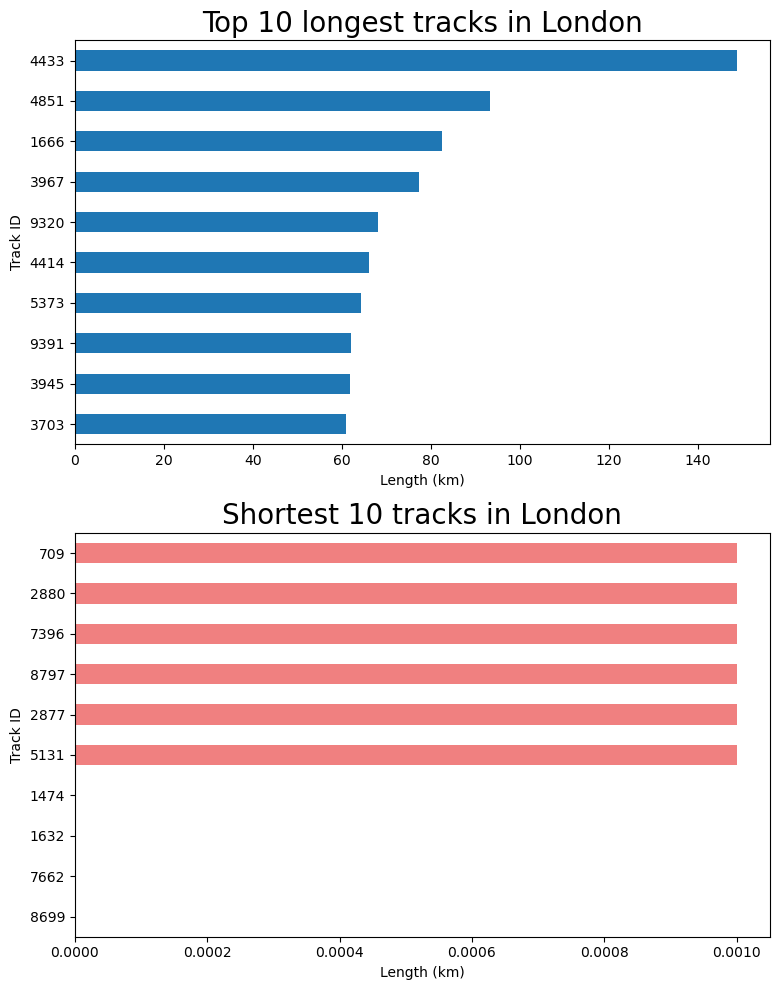

In [39]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert 'length' to numeric, coercing errors to NaN
tracks_df['length'] = pd.to_numeric(tracks_df['length'], errors='coerce')
# Drop rows with NaN in 'length'
tracks_df = tracks_df.dropna(subset=['length'])

plt.figure(figsize=(15, 10))

# London Top 10 longest tracks (Km)
plt.subplot(2, 2, 1)
top_tracks = (tracks_df.groupby('id')['length'].sum() / 1000).sort_values(ascending=False)[:10]
top_tracks.sort_values().plot.barh()
plt.ylabel('Track ID')
plt.xlabel('Length (km)')
plt.title("Top 10 longest tracks in London", size=20)

# London Top 10 shortest tracks (Km)
plt.subplot(2, 2, 3)
shortest_tracks = (tracks_df.groupby('id')['length'].sum() / 1000).sort_values().head(10)
shortest_tracks.plot.barh(color='lightcoral')
plt.ylabel('Track ID')
plt.xlabel('Length (km)')
plt.title("Shortest 10 tracks in London", size=20)

plt.tight_layout()
plt.show()

In [55]:
Mid_Map = [x for sublist in tracks_df['Lat Long List'] for x in sublist]
av_lat = sum([c[0] for c in Mid_Map]) / len(Mid_Map)
avg_long = sum([c[1] for c in Mid_Map]) / len(Mid_Map)

London = folium.Map(location=[av_lat, avg_long], zoom_start=15)

for i, row in tracks_df.iterrows():
    folium.PolyLine(
        locations=row['Lat Long List'],
        color="blue",
        weight=3,
        opacity=0.8
    ).add_to(London)

London.save("tracks_Map.html")
display(London)


TypeError: unsupported operand type(s) for +: 'int' and 'str'

In [58]:
tracks_df


,id,geometry,buildstart,opening,closure,length,city_id,Lat Long List
0,1911,"LINESTRING(19.0817752 47.5005079,19.0817355 47...",0.0,0.0,999999.0,6719,29,"[[19.0817752, 47.5005079], [19.0817355, 47.500..."
1,2563,"LINESTRING(16.4151057 48.1907238,16.4156455 48...",0.0,0.0,999999.0,199,118,"[[16.4151057, 48.1907238], [16.4156455, 48.190..."
2,2557,"LINESTRING(16.4164437 48.1839655,16.4161534 48...",0.0,0.0,999999.0,925,118,"[[16.4164437, 48.1839655], [16.4161534, 48.183..."
3,2558,"LINESTRING(16.4164901 48.1839473,16.416198 48....",0.0,0.0,999999.0,881,118,"[[16.4164901, 48.1839473], [16.416198, 48.1836..."
4,2564,"LINESTRING(16.415259 48.1908074,16.4153634 48....",0.0,0.0,999999.0,213,118,"[[16.415259, 48.1908074], [16.4153634, 48.1907..."
...,...,...,...,...,...,...,...,...
9266,9732,"LINESTRING(-3.838067 56.0044551,-3.8385588 56....",0.0,0.0,999999.0,383,48,"[[-3.838067, 56.0044551], [-3.8385588, 56.0040..."
9267,9734,"LINESTRING(-3.8549229 55.9960854,-3.8544735 55...",0.0,0.0,999999.0,28,48,"[[-3.8549229, 55.9960854], [-3.8544735, 55.996..."
9268,9735,"LINESTRING(-3.8597111 55.9955538,-3.8572319 55...",0.0,0.0,999999.0,305,48,"[[-3.8597111, 55.9955538], [-3.8572319, 55.995..."
9269,9736,"LINESTRING(-3.8544735 55.9961285,-3.8529015 55...",0.0,0.0,999999.0,828,48,"[[-3.8544735, 55.9961285], [-3.8529015, 55.996..."


In [61]:
import ast
import folium

# Step 1: Parse your 'Lat Long List' column
def ensure_list_of_coords(val):
    if isinstance(val, str):
        try:
            coords = ast.literal_eval(val)
            return [[float(c[0]), float(c[1])] for c in coords]
        except:
            return []
    elif isinstance(val, list):
        return [[float(c[0]), float(c[1])] for c in val]
    else:
        return []

# Apply parsing
tracks_df['Parsed Coords'] = tracks_df['Lat Long List'].apply(ensure_list_of_coords)

# Step 2: Check for empty coordinate lists
# Optional: print out rows with empty coords for debugging
empty_rows = tracks_df[tracks_df['Parsed Coords'].apply(lambda x: len(x) == 0)]
if not empty_rows.empty:
    print("Rows with empty coordinate lists:")
    print(empty_rows)

# Step 3: Calculate center based on all valid points
all_coords = [coord for sublist in tracks_df['Parsed Coords'] for coord in sublist]

# Make sure there are points available
if len(all_coords) == 0:
    raise ValueError("No valid coordinate points found in data.")

av_lat = sum([c[0] for c in all_coords]) / len(all_coords)
av_long = sum([c[1] for c in all_coords]) / len(all_coords)

# Step 4: Create the map centered around the average point
map_obj = folium.Map(location=[av_lat, av_long], zoom_start=15)

# Step 5: Plot only the non-empty coordinate lists
valid_rows = tracks_df[tracks_df['Parsed Coords'].apply(lambda x: len(x) > 0)]

for i, row in valid_rows.iterrows():
    folium.PolyLine(
        locations=row['Parsed Coords'],
        color='blue',
        weight=3,
        opacity=0.8
    ).add_to(map_obj)

# Step 6: Save and display the map
map_obj.save("tracks_Map.html")
display(map_obj)

Rows with empty coordinate lists:
        id            geometry  buildstart  opening   closure  length  \
2950  1474  LINESTRING Z EMPTY         0.0   1930.0  999999.0       0   

      city_id Lat Long List Parsed Coords  
2950       19            []            []  
